# PLOT-ME
This notebook will help you with creating amazing plots. (p.s - we used this tool to plot our plots.)
For the same, you will need to install two major libraries -
-Geoplot 
-Geopandas

You can run the following code in your terminal to install them. Though let me warn you - these might sometimes pose an error while installation. _You can always use Colab for a situation like that!_

* Geopandas - `conda install geopandas` or `conda install --channel conda-forge geopandas` (Try to use the first one before)

* Geoplot - `conda install --channel conda-forge geoplot`

In [1]:
# Importing the required libraries
import geoplot as gplt
import geopandas as gpd
import geoplot.crs as gcrs
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Make sure you mention the relative or complete path of the csv file containing the co-ordinates you want to plot
path = ''

# Read the csv into the df dataframe
df = pd.read_csv(path)

In [114]:
# Run this cell if you want to random sample the rows
# df = df.sample(frac=1)

In [4]:
# Run this cell if you want to replace any String value with an integer
# df = df.replace(['col1', 'col2'],[int_val1, int_val2])

In [6]:
# Visualize the dataframe
df

,Unnamed: 0,LONGITUDE_,LATITUDE_G,State
0,0,134.141464,-30.215218,0
1,1,134.775391,-30.303629,0
2,2,134.781998,-30.334396,0
3,3,136.051544,-27.543329,0
4,4,136.034317,-27.604906,0
...,...,...,...,...
1121757,381785,140.217988,-35.952556,1
1121758,381786,132.334216,-31.725079,1
1121759,381787,134.027861,-28.259826,1
1121760,381788,138.794781,-34.181338,1


Now, we need to convert the Pandas Dataframe into a GeoPandas Dataframe so as to include the Geometry attribute. A Pandas dataframe is just rows of values. It doesn't know what a co-ordinate is. To include the Geospatial feature, we use Geopandas

In [7]:
# Convert the dataframe into a Geopandas dataframe
# specify the column names containing Lat & Lng correctly in the code-line down below
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.LONGITUDE_, df.LATITUDE_G))

In [8]:
# Set the CRS - Initial CRS
# By default the co-ordinates are in CRS - EPSG 4326 
gdf = gdf.set_crs(epsg=4326)

# Run these cells if you want to reproject your crs
# gdf = gdf.set_crs(epsg=3107)
# gdf = gdf.to_crs(epsg=4326)


In [9]:
# Let's get a basemap 
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

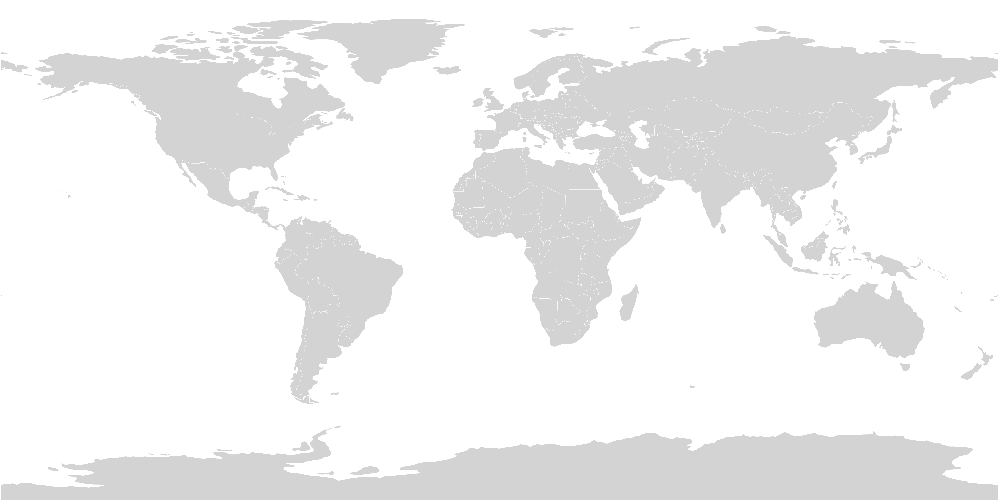

In [10]:
# Let's plot that basemap
# Tune in the parameters to your choice
# figsize represents the size of the plot 
ax = gplt.polyplot(
    world,
    edgecolor='white',
    facecolor='lightgray',
    figsize=(100, 100)
)

Now we'll be using the pointplot funtion to plot our points. You can visit and check the documentation to customize your plots [here]().

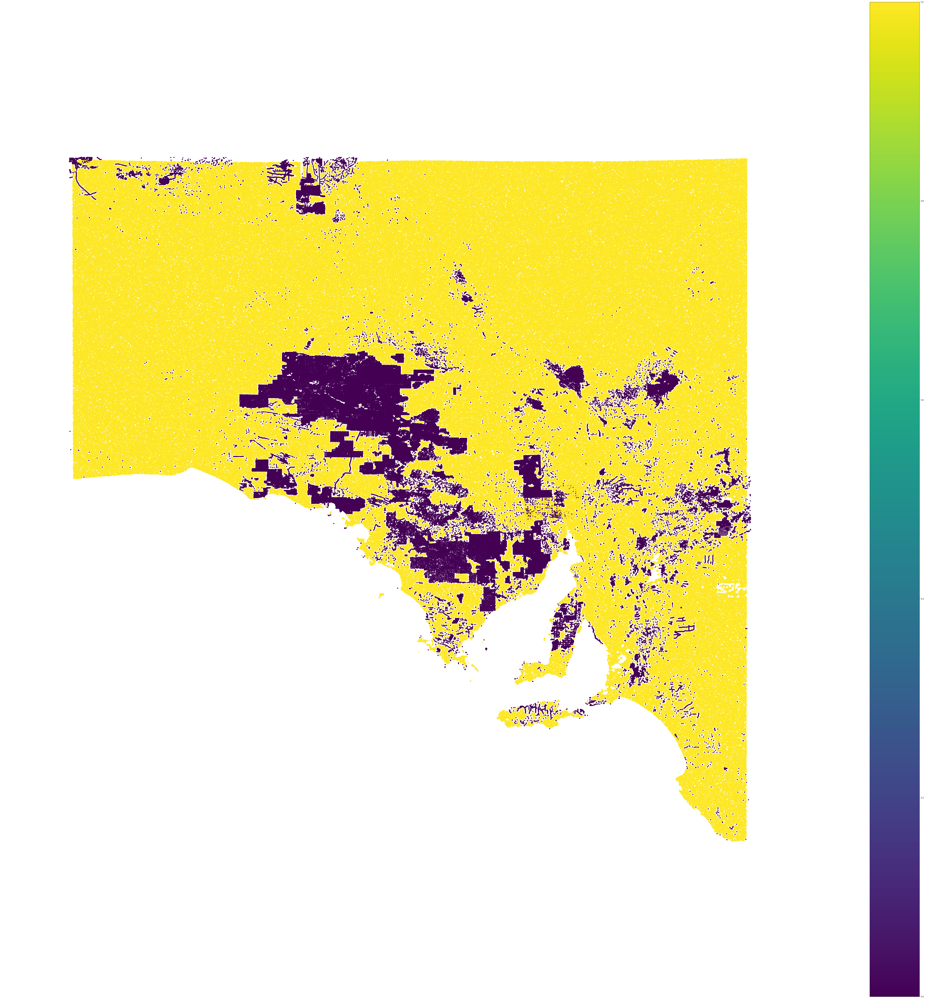

In [121]:
# Now, we'll plot our points using the pointplot funtion
plotted = gplt.pointplot(
  gdf,
  ax=ax
  hue="State",
  limits=(1,1),
  figsize=(100,100),
  legend=True,
  legend_var="hue")

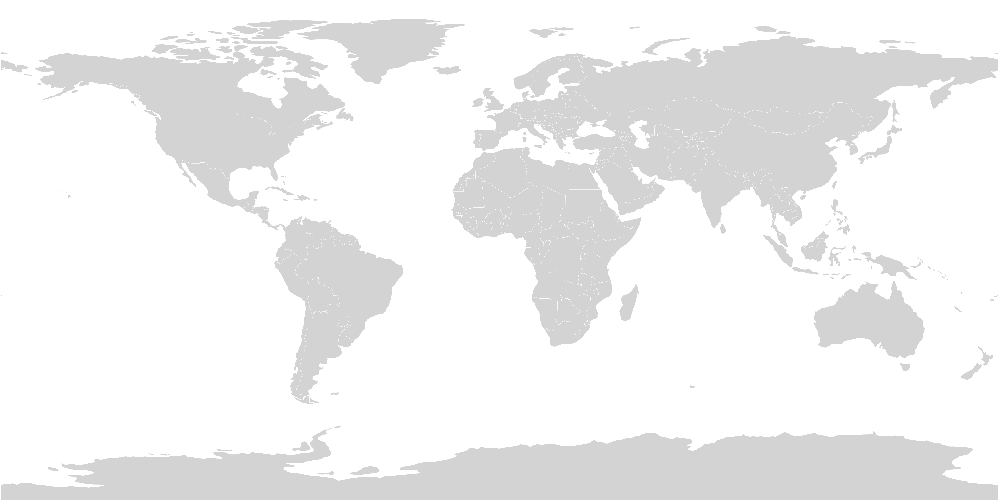

In [ ]:
c_codes = ['Ca', 'Rb', 'Fe', 'Au','Cu','Ag','Mg','Cr','Ni']
min_df = gdf.query("CHEM_CODE=='Ca'")


plotted = gplt.pointplot(
  min_df,
  fig_size=(100,100),
  scale="UNIT_PPM_CLASS",
  limits=(1, 5),
  hue="UNIT_PPM_CLASS")

In [67]:
df2 = pd.read_csv('/home/xavian/Downloads/The_Gawler_Challenge/tmp/Model_1_Prediction.csv')
df = df2.sample(frac=1)